# Laret Timeseries to match Niwot and Sodankyla 

In [1]:
# import packages 
%matplotlib widget
# plotting packages 
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns 

# interactive plotting
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots # adding for subplots

# data packages 
import pandas as pd
import numpy as np
import xarray as xr
from datetime import datetime

import csv 
import copy 
import os.path 

In [2]:
# Define Plot Constants
# Colors 
coloropen = "darkblue"
colorfor1 = "darkred"
colorfor2 = "yellowgreen"
colorfor3 = "darkorange"

# Legend Names 
nameopen="SHD1 Open Site"
namefor1="SHD2 For1: Cable Car"
namefor2="SHD3 For2: Dense Forest"
namefor3="NU6   For3: Circle Gap"

## Snow Unloading Classifications

In [3]:
# Open the observations only dataset, with all the datetimes and classifications
# obs = pd.read_csv("/Users/Lumbr/OneDrive - UW/Documents/Washington/UnloadingRegimes/Excel/Datetime/datetimeformat_ccg_classifications_only_alldates.csv")

# using the cut dataset for right now 
obs = pd.read_csv("/Users/Lumbr/OneDrive - UW/Documents/Washington/UnloadingRegimes/Excel/Datetime/datetimeformat_ccg_classifications_only_cutdates.csv")

obs['datetime'] = pd.to_datetime(obs['datetime'])
# obs.index = pd.DatetimeIndex(obs['datetime'])
obs.dropna(axis=0, how='all', inplace=True) #removing row is entire row is NAN #careful with this, without datetime a lot gets removed 
obsx = obs.to_xarray()

# cut the dates, if you need
# obs_cut = obs.copy(deep=True)
# obs_cut = obs.loc['2021-02-13T12:00:00':'2021-05-04T12:00:00'] 

## Met Data

In [4]:
# 1 hour resampled cleaned time series  
for1 = pd.read_csv("/Users/Lumbr/OneDrive - UW/Documents/Washington/UnloadingRegimes/MetStations/Cleaned/for1c_h.csv")
for2 = pd.read_csv("/Users/Lumbr/OneDrive - UW/Documents/Washington/UnloadingRegimes/MetStations/Cleaned/for2c_h.csv")
for3 = pd.read_csv("/Users/Lumbr/OneDrive - UW/Documents/Washington/UnloadingRegimes/MetStations/Cleaned/for3c_h.csv")
for4 = pd.read_csv("/Users/Lumbr/OneDrive - UW/Documents/Washington/UnloadingRegimes/MetStations/Cleaned/for4c_h.csv")
opn  = pd.read_csv("/Users/Lumbr/OneDrive - UW/Documents/Washington/UnloadingRegimes/MetStations/Cleaned/opnc_h.csv")

# Index by datetime 
for1.index = pd.DatetimeIndex(for1['datetime'])
for2.index = pd.DatetimeIndex(for2['datetime'])
for3.index = pd.DatetimeIndex(for3['datetime'])
for4.index = pd.DatetimeIndex(for4['datetime'])
opn.index =  pd.DatetimeIndex(opn['datetime'])

# # Create xarray dataset 
# for1x = for1.to_xarray()
# for2x = for2.to_xarray()
# for3x = for3.to_xarray()
# for4x = for4.to_xarray()
# opnx = opn.to_xarray()

### Laret Main Station Data to add to the plots 

In [5]:
laretstation = pd.read_csv("/Users/Lumbr/OneDrive - UW/Documents/Washington/UnloadingRegimes/MetStations/LaretStation/CSV/laretstation.csv")
laretstation.index = pd.DatetimeIndex(laretstation['datetime'])
# laretstation.drop(columns=['datetime'], inplace=True)

## Shade Function

In [6]:
def Shade(fig, df, variable, level, mode, fillcolor, layer, opacity):
  
    """
    Set a specified color as background for given levels of a specified variable using a shape.
    
    Keyword arguments:
    ==================
    fig -- plotly figure
    variable -- column name in a pandas dataframe
    level -- int or float
    mode -- set threshold above or below
    fillcolor -- any color type that plotly can handle
    layer -- position of shape in plotly fiugre, like "below"
    opacity -- opacity of the fillcolor, WORKING but the ordering matters.. so pay attention to that 
    """
    
    if mode == 'above':
        m = df[variable].gt(level)
    
    if mode == 'below':
        m = df[variable].lt(level)
        
    df1 = df[m].groupby((~m).cumsum())['datetime'].agg(['first','last'])

    for index, row in df1.iterrows():
        # print(row['first'], row['last'])
        fig.add_shape(type="rect", xref="x", yref="paper", x0=row['first'], y0=0, x1=row['last'], y1=1, opacity=opacity, line=dict(color="rgba(0,0,0,0)",width=3),fillcolor=fillcolor,layer=layer) 
        fig.add_shape(type="rect", xref="x", yref="paper", x0=row['first'], y0=0, x1=row['last'], y1=1, opacity=opacity, line=dict(color="rgba(0,0,0,0)",width=3),fillcolor=fillcolor,layer=layer)
   
    return(fig)

# Plotly Plot to Match Niwot Ridge Timeseries 

In [6]:
# Final Colors for Scatter Plots
## Define some plotting constants for easier coding 
plt.close('all')

# Colors
colornosnow='lightgrey' # the plotly no snow color so that it is lightly and not dominate in the plot 
# colornosnow = '#D2B48C' # nice tan
colorsnow = '#7dcfd4' # slightly desaturated cyan
colorsnowunload = '#1F15D5' # bright, deep blue 
colorsunny = '#E4E44A' # trying a little less bright 

# Grouped Colors
colors = [colorsnow, colorsnowunload] # my colors 

# Names
namesnow = 'Snow Staying'
namesnowunload = 'Snow Unloading'
group_labels = ['Snow Staying', 'Snow Unloading']

nametemp = "Air Temperature (C)"
nameSW = "Shortwave (W/m2)"
namewind = "Wind Speed (m/s)"

colorstation1='black'

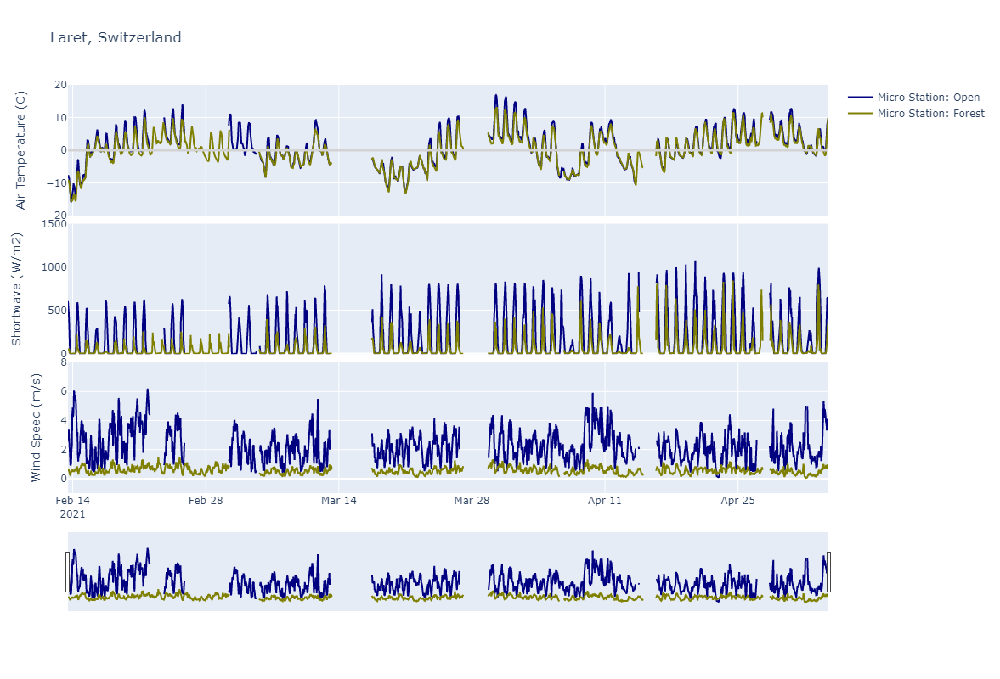

In [8]:
fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=0.02)

# # using the shade function
# fig = Shade(fig = fig, df=obs, variable = 'A', level = .5, mode = 'above', fillcolor = colorsnow,      layer = 'below', opacity=0.5) # if snow, lightblue
# fig = Shade(fig = fig, df=obs, variable = 'A', level = .5, mode = 'below', fillcolor = colornosnow,    layer = 'below', opacity=0.5) # if no snow, grey
# fig = Shade(fig = fig, df=obs, variable = 'E', level = .5, mode = 'above', fillcolor = colorsunny,     layer = 'below', opacity=0.5) # if sun, yellow
# fig = Shade(fig = fig, df=obs, variable = 'CD',level = .5, mode = 'below', fillcolor = colorsnowunload,layer = 'below', opacity=0.3) # if unloading, blue

# row 1, air temp
fig.add_trace(go.Scatter(x = opn['datetime'], y = opn['AirTC_Avg'],line_color='navy', showlegend=False),row=1, col=1)
fig.add_trace(go.Scatter(x = for1['datetime'], y = for1['AirTC_Avg'],line_color='olive', showlegend=False),row=1, col=1)

fig.add_hline(y=0, line_color='lightgrey', line_width=3, row=1, col=1) # plotly add hline instead of zeros 

# row 2, SW
fig.add_trace(go.Scatter(x = opn['datetime'], y = opn['SWR_Avg'],line_color='navy', showlegend=False),row=2, col=1)
fig.add_trace(go.Scatter(x = for1['datetime'], y = for1['SWR_Avg'],line_color='olive', showlegend=False),row=2, col=1)


# row 3, wind speed
fig.add_trace(go.Scatter(x = opn['datetime'], y = opn['WS_ms_Avg'],line_color='navy', name='Micro Station: Open'),row=3, col=1)
fig.add_trace(go.Scatter(x = for1['datetime'], y = for1['WS_ms_Avg'],line_color='olive', name='Micro Station: Forest'),row=3, col=1)

# axes 
fig.update_yaxes(title_text=namewind, range=[-1,8],     row=3, col=1)
fig.update_yaxes(title_text=nametemp, range=[-20,20],   row=1, col=1)
fig.update_yaxes(title_text=nameSW,   range=[-10,1500], row=2, col=1)

fig.update_xaxes(rangeslider_visible=True, row=3, col=1) # currently set to be under row5, but can prob figure out a better way for subplots if I want it

fig.update_layout(height=800, width=1200, title_text="Laret, Switzerland")
fig.show()

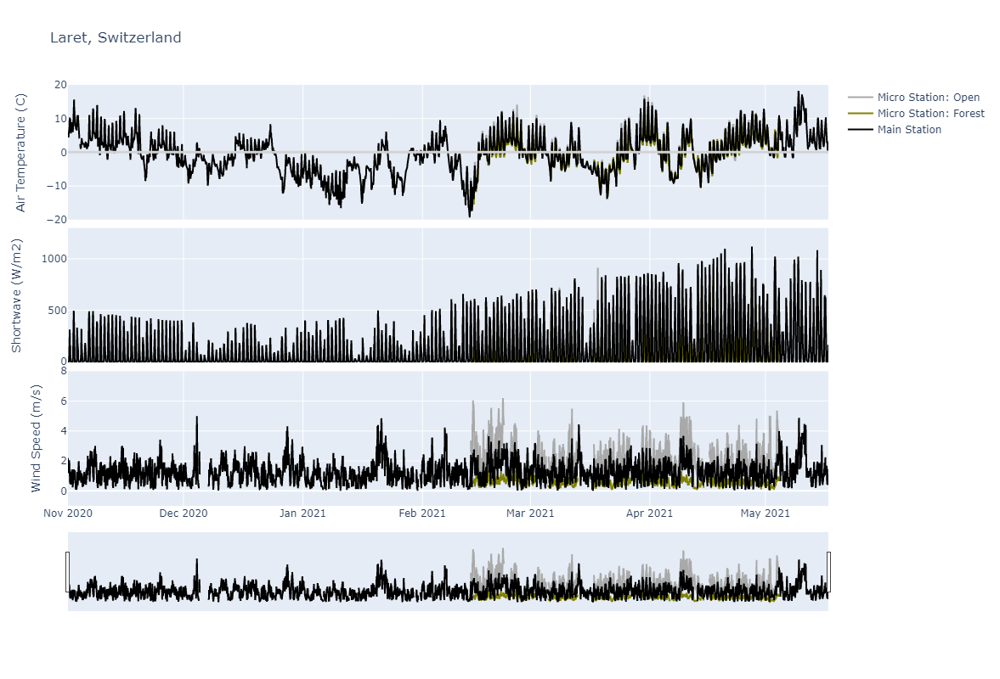

In [8]:
plt.close('all')
fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=0.02)

# # using the shade function
# fig = Shade(fig = fig, df=obs, variable = 'A', level = .5, mode = 'above', fillcolor = colorsnow,      layer = 'below', opacity=0.5) # if snow, lightblue
# fig = Shade(fig = fig, df=obs, variable = 'A', level = .5, mode = 'below', fillcolor = colornosnow,    layer = 'below', opacity=0.5) # if no snow, grey
# fig = Shade(fig = fig, df=obs, variable = 'E', level = .5, mode = 'above', fillcolor = colorsunny,     layer = 'below', opacity=0.5) # if sun, yellow
# fig = Shade(fig = fig, df=obs, variable = 'CD',level = .5, mode = 'below', fillcolor = colorsnowunload,layer = 'below', opacity=0.3) # if unloading, blue

# row 1, air temp
fig.add_trace(go.Scatter(x = opn['datetime'], y = opn['AirTC_Avg'],line_color='darkgrey', showlegend=False),row=1, col=1)
fig.add_trace(go.Scatter(x = for1['datetime'], y = for1['AirTC_Avg'],line_color='olive', showlegend=False),row=1, col=1)
fig.add_trace(go.Scatter(x = laretstation['datetime'], y = laretstation['ta_1'],line_color=colorstation1, showlegend=False),row=1, col=1)

fig.add_hline(y=0, line_color='lightgrey', line_width=3, row=1, col=1) # plotly add hline instead of zeros 

# row 2, SW
fig.add_trace(go.Scatter(x = opn['datetime'], y = opn['SWR_Avg'],line_color='darkgrey', showlegend=False),row=2, col=1)
fig.add_trace(go.Scatter(x = for1['datetime'], y = for1['SWR_Avg'],line_color='olive', showlegend=False),row=2, col=1)
fig.add_trace(go.Scatter(x = laretstation['datetime'], y = laretstation['iswr'],line_color=colorstation1, showlegend=False),row=2, col=1)

# row 3, wind speed
fig.add_trace(go.Scatter(x = opn['datetime'], y = opn['WS_ms_Avg'],line_color='darkgrey', name='Micro Station: Open'),row=3, col=1)
fig.add_trace(go.Scatter(x = for1['datetime'], y = for1['WS_ms_Avg'],line_color='olive', name='Micro Station: Forest'),row=3, col=1)
fig.add_trace(go.Scatter(x = laretstation['datetime'], y = laretstation['vw_1'],line_color=colorstation1, name='Main Station'),row=3, col=1)

# axes 
fig.update_yaxes(title_text=namewind, range=[-1,8],     row=3, col=1)
fig.update_yaxes(title_text=nametemp, range=[-20,20],   row=1, col=1)
fig.update_yaxes(title_text=nameSW,   range=[-10,1300], row=2, col=1)

fig.update_xaxes(rangeslider_visible=True, row=3, col=1) # currently set to be under row5, but can prob figure out a better way for subplots if I want it

fig.update_layout(height=800, width=1200, title_text="Laret, Switzerland")
fig.show()

In [9]:
# cut versions of met and rad to be the same as the other data
laretstation_cut = laretstation.loc['2021-02-13T12:00:00':'2021-05-04T12:00:00']

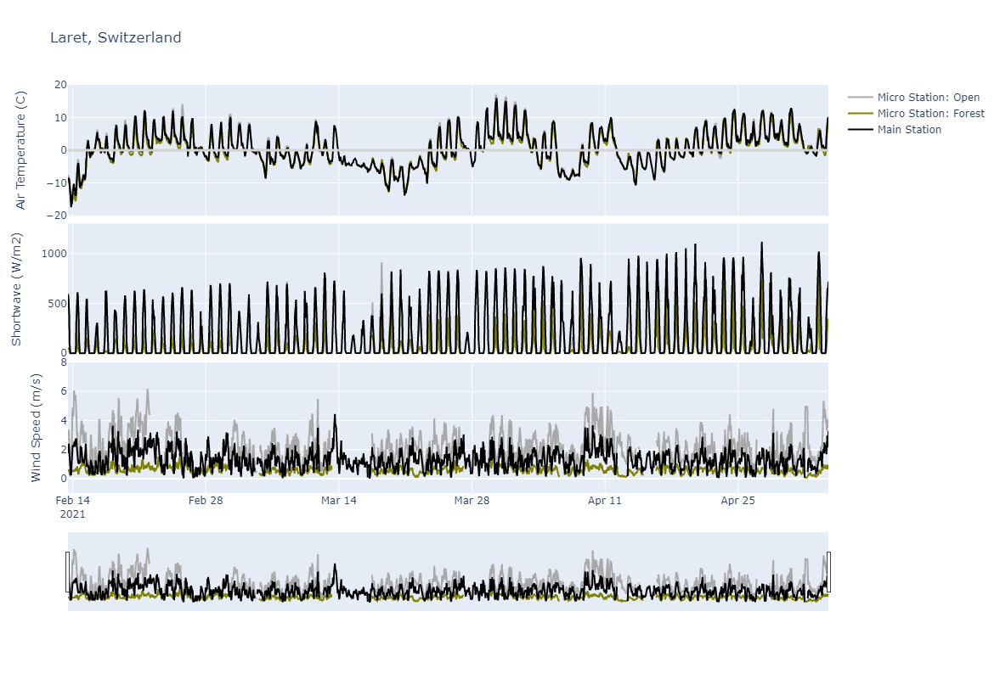

In [15]:
plt.close('all')
fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=0.02)

# # using the shade function
# fig = Shade(fig = fig, df=obs, variable = 'A', level = .5, mode = 'above', fillcolor = colorsnow,      layer = 'below', opacity=0.5) # if snow, lightblue
# fig = Shade(fig = fig, df=obs, variable = 'A', level = .5, mode = 'below', fillcolor = colornosnow,    layer = 'below', opacity=0.5) # if no snow, grey
# fig = Shade(fig = fig, df=obs, variable = 'E', level = .5, mode = 'above', fillcolor = colorsunny,     layer = 'below', opacity=0.5) # if sun, yellow
# fig = Shade(fig = fig, df=obs, variable = 'CD',level = .5, mode = 'below', fillcolor = colorsnowunload,layer = 'below', opacity=0.3) # if unloading, blue

# row 1, air temp
fig.add_trace(go.Scatter(x = opn['datetime'], y = opn['AirTC_Avg'],line_color='darkgrey', showlegend=False),row=1, col=1)
fig.add_hline(y=0, line_color='lightgrey', line_width=3, row=1, col=1) # plotly add hline instead of zeros 

fig.add_trace(go.Scatter(x = for1['datetime'], y = for1['AirTC_Avg'],line_color='olive', showlegend=False),row=1, col=1)
fig.add_trace(go.Scatter(x = laretstation_cut['datetime'], y = laretstation_cut['ta_1'],line_color=colorstation1, showlegend=False),row=1, col=1)


# row 2, SW
fig.add_trace(go.Scatter(x = opn['datetime'], y = opn['SWR_Avg'],line_color='darkgrey', showlegend=False),row=2, col=1)
fig.add_trace(go.Scatter(x = for1['datetime'], y = for1['SWR_Avg'],line_color='olive', showlegend=False),row=2, col=1)
fig.add_trace(go.Scatter(x = laretstation_cut['datetime'], y = laretstation_cut['iswr'],line_color=colorstation1, showlegend=False),row=2, col=1)

# row 3, wind speed
fig.add_trace(go.Scatter(x = opn['datetime'], y = opn['WS_ms_Avg'],line_color='darkgrey', name='Micro Station: Open'),row=3, col=1)
fig.add_trace(go.Scatter(x = for1['datetime'], y = for1['WS_ms_Avg'],line_color='olive', name='Micro Station: Forest'),row=3, col=1)
fig.add_trace(go.Scatter(x = laretstation_cut['datetime'], y = laretstation_cut['vw_1'],line_color=colorstation1, name='Main Station'),row=3, col=1)

# axes 
fig.update_yaxes(title_text=namewind, range=[-1,8],     row=3, col=1)
fig.update_yaxes(title_text=nametemp, range=[-20,20],   row=1, col=1)
fig.update_yaxes(title_text=nameSW,   range=[-10,1300], row=2, col=1)

fig.update_xaxes(rangeslider_visible=True, row=3, col=1) # currently set to be under row5, but can prob figure out a better way for subplots if I want it

fig.update_layout(height=800, width=1200, title_text="Laret, Switzerland")
fig.show()

# Shade 2 Timeseries

In [11]:
def Shade2(fig, df, variable, level, mode, fillcolor, layer, opacity):
  
    """
    Set a specified color as background for given levels of a specified variable using a shape.
    
    Keyword arguments:
    ==================
    fig -- plotly figure
    variable -- column name in a pandas dataframe
    level -- int or float
    mode -- set threshold above or below
    fillcolor -- any color type that plotly can handle
    layer -- position of shape in plotly fiugre, like "below"
    opacity -- opacity of the fillcolor, WORKING but the ordering matters.. so pay attention to that 
    """
    
    if mode == 'above':
        m = df[variable].gt(level)
    
    if mode == 'below':
        m = df[variable].lt(level)
        
    df1 = df[m].groupby((~m).cumsum())['datetime'].agg(['first','last'])

    for index, row in df1.iterrows():
        # print(row['first'], row['last'])
        fig.add_shape(type="rect", xref="x", yref="paper", x0=row['first'], y0=0, x1=row['last'], y1=1, opacity=opacity, line=dict(color=fillcolor, width=3),fillcolor=fillcolor,layer=layer) 
        fig.add_shape(type="rect", xref="x", yref="paper", x0=row['first'], y0=0, x1=row['last'], y1=1, opacity=opacity, line=dict(color=fillcolor, width=3),fillcolor=fillcolor,layer=layer)
   
    return(fig)

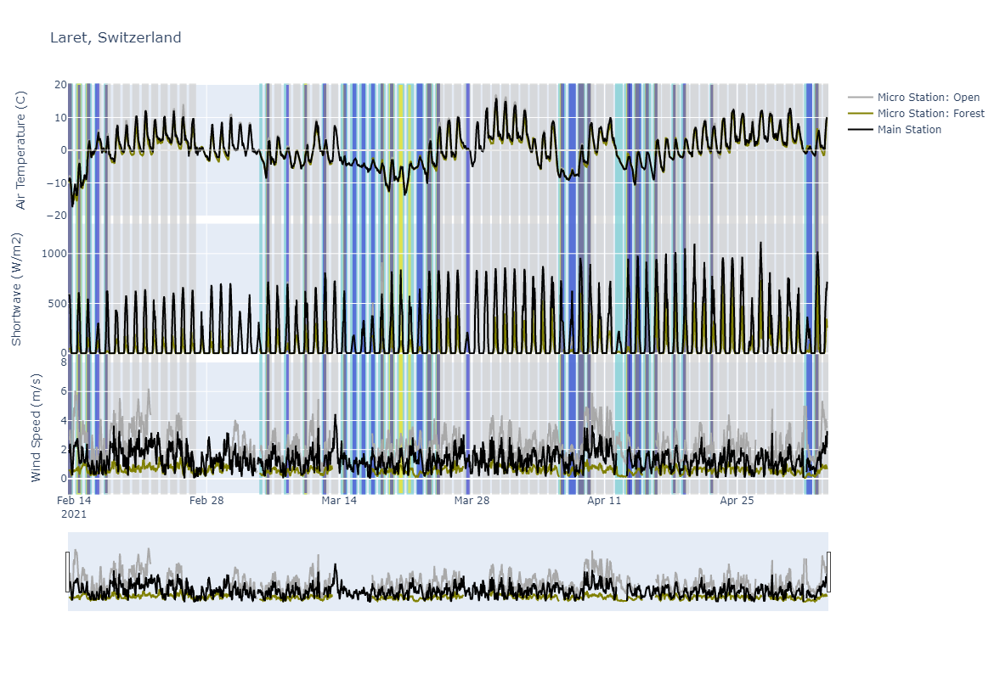

In [14]:
plt.close('all')
fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=0.02)

# using the shade function
fig = Shade2(fig = fig, df=obs, variable = 'A', level = .5, mode = 'above', fillcolor = colorsnow,      layer = 'below', opacity=0.5) # if snow, lightblue
fig = Shade2(fig = fig, df=obs, variable = 'A', level = .5, mode = 'below', fillcolor = colornosnow,    layer = 'below', opacity=0.5) # if no snow, grey
fig = Shade2(fig = fig, df=obs, variable = 'E', level = .5, mode = 'above', fillcolor = colorsunny,     layer = 'below', opacity=0.5) # if sun, yellow
fig = Shade2(fig = fig, df=obs, variable = 'CD',level = .5, mode = 'below', fillcolor = colorsnowunload,layer = 'below', opacity=0.3) # if unloading, blue

# row 1, air temp
fig.add_trace(go.Scatter(x = opn['datetime'], y = opn['AirTC_Avg'],line_color='darkgrey', showlegend=False),row=1, col=1)
fig.add_trace(go.Scatter(x = for1['datetime'], y = for1['AirTC_Avg'],line_color='olive', showlegend=False),row=1, col=1)
fig.add_trace(go.Scatter(x = laretstation_cut['datetime'], y = laretstation_cut['ta_1'],line_color=colorstation1, showlegend=False),row=1, col=1)

fig.add_hline(y=0, line_color='lightgrey', line_width=1, row=1, col=1) # plotly add hline instead of zeros 

# row 2, SW
fig.add_trace(go.Scatter(x = opn['datetime'], y = opn['SWR_Avg'],line_color='darkgrey', showlegend=False),row=2, col=1)
fig.add_trace(go.Scatter(x = for1['datetime'], y = for1['SWR_Avg'],line_color='olive', showlegend=False),row=2, col=1)
fig.add_trace(go.Scatter(x = laretstation_cut['datetime'], y = laretstation_cut['iswr'],line_color=colorstation1, showlegend=False),row=2, col=1)

# row 3, wind speed
fig.add_trace(go.Scatter(x = opn['datetime'], y = opn['WS_ms_Avg'],line_color='darkgrey', name='Micro Station: Open'),row=3, col=1)
fig.add_trace(go.Scatter(x = for1['datetime'], y = for1['WS_ms_Avg'],line_color='olive', name='Micro Station: Forest'),row=3, col=1)
fig.add_trace(go.Scatter(x = laretstation_cut['datetime'], y = laretstation_cut['vw_1'],line_color=colorstation1, name='Main Station'),row=3, col=1)

# axes 
fig.update_yaxes(title_text=namewind, range=[-1,8],     row=3, col=1)
fig.update_yaxes(title_text=nametemp, range=[-20,20],   row=1, col=1)
fig.update_yaxes(title_text=nameSW,   range=[-10,1300], row=2, col=1)

fig.update_xaxes(rangeslider_visible=True, row=3, col=1) # currently set to be under row5, but can prob figure out a better way for subplots if I want it

fig.update_layout(height=800, width=1200, title_text="Laret, Switzerland")
fig.show()

# Laret Met Station 1x1 plots 
### for Giulia

# Other laret station data plots

## Laret Station Data, looking at precip, swe, snow depth

In [15]:
laretstation

,datetime,p,ta_1,rh_1,vw_1,dw_1,vw_2,hs_1,rri,rr_sum,iswr,ilwr,swe
datetime,,,,,,,,,,,,,
2020-11-01 00:00:00,2020-11-01 00:00:00,85470.385000,5.473333,0.542500,2.183500,195.416667,2.100333,0.044333,NaN,NaN,0.266667,261.266667,28.596667
2020-11-01 01:00:00,2020-11-01 01:00:00,85485.266667,5.406667,0.541333,1.193333,226.200000,1.110667,0.044500,NaN,NaN,1.100000,286.033333,31.648333
2020-11-01 02:00:00,2020-11-01 02:00:00,85458.373333,5.223333,0.551000,1.748667,181.666667,1.771500,0.044667,NaN,NaN,0.300000,259.233333,37.580000
2020-11-01 03:00:00,2020-11-01 03:00:00,85448.790000,4.365000,0.582833,1.306333,181.166667,1.309667,0.045000,NaN,NaN,0.700000,273.766667,41.503333
2020-11-01 04:00:00,2020-11-01 04:00:00,85428.033333,4.858333,0.556167,1.517500,183.250000,1.530667,0.044833,NaN,NaN,0.866667,284.500000,41.981667
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-17 04:00:00,2021-05-17 04:00:00,84002.601667,0.455000,0.982167,0.406833,187.683333,0.370500,0.001000,NaN,NaN,2.000000,271.200000,0.750000
2021-05-17 05:00:00,2021-05-17 05:00:00,84016.248333,0.683333,0.957500,1.002500,129.355000,0.869833,0.001000,0.086,0.014,30.700000,298.466667,0.615000
2021-05-17 06:00:00,2021-05-17 06:00:00,84088.075000,1.528333,0.962167,0.458333,154.020167,0.450333,NaN,NaN,NaN,87.966667,280.033333,0.325000


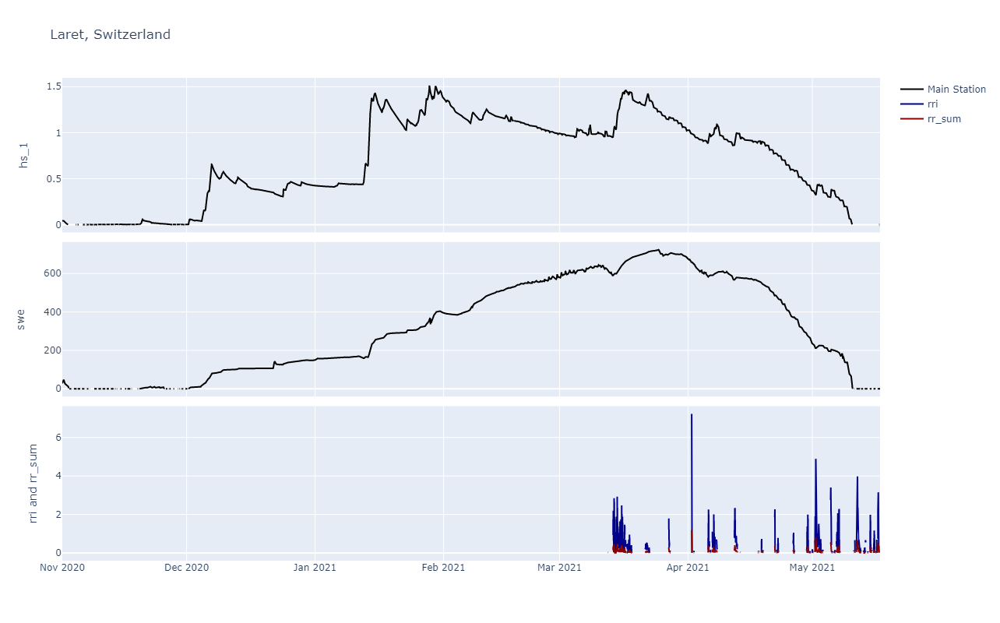

In [18]:
plt.close('all')
fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=0.02)

# row 1
fig.add_trace(go.Scatter(x = laretstation['datetime'], y = laretstation['hs_1'],line_color=colorstation1, name="Main Station"),row=1, col=1)

# row 2
fig.add_trace(go.Scatter(x = laretstation['datetime'], y = laretstation['swe'], line_color=colorstation1, showlegend=False),row=2, col=1)

# row 3
fig.add_trace(go.Scatter(x = laretstation['datetime'], y = laretstation['rri'], line_color='darkblue', name='rri'),row=3, col=1)
fig.add_trace(go.Scatter(x = laretstation['datetime'], y = laretstation['rr_sum'], line_color='darkred', name='rr_sum'),row=3, col=1)

# axes 
fig.update_yaxes(title_text='hs_1',  row=1, col=1)
fig.update_yaxes(title_text='swe',   row=2, col=1)
fig.update_yaxes(title_text='rri and rr_sum',row=3, col=1)

# fig.update_xaxes(rangeslider_visible=True, row=3, col=1) # currently set to be under row5, but can prob figure out a better way for subplots if I want it

fig.update_layout(height=800, width=1200, title_text="Laret, Switzerland")
fig.show()